# Explaratory Data Analysis & Data Cleaning

## Goal

The purpose of this study is to provide summary, descriptive analysis and cleaning steps of the training data of this assignment. 

The exercise_40_train.csv file is going to be training dataset for the models of this study.

## Data Description

The dataset we analyze contains 40000 observations.
Along with the target variable, we have 101 columns in exercise_40_train.csv,and 100 columns in exercise_40_test.csv

## Code and Results

End of the each section and in the middle of the code blocks you will encounter the main/intermadiate findings of the study as brief comments.

The "1.EDA & Data Cleaning" file shows the code and results for Explaratory Data Analysis & Data Cleaning steps of the exercise_40_train.csv.

The "2.Modeling" file shows the code and results of preprocessing and machine learning models.

The "glmresults.csv" file contains the prediction results obtained from Logistic Regression.

The "nonglmresults.csv" file contains the prediction results obtained from Neural Network.


In [1]:
#Load Libraries

import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Visuallization 
import matplotlib.pyplot as plt
import seaborn as sns

# For Q-Q plots
import scipy.stats as stats

# Feature-engine
from feature_engine.encoding import OneHotEncoder
from feature_engine.imputation import CategoricalImputer
from feature_engine import imputation as mdi
from feature_engine import discretisation as dsc
from feature_engine import encoding as ce
from feature_engine.transformation import YeoJohnsonTransformer

## 1. Data Collection

In [2]:
data=pd.read_csv('exercise_40_train.csv')
data

,y,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,x91,x92,x93,x94,x95,x96,x97,x98,x99,x100
0,0,0.165254,18.060003,Wed,1.077380,-1.339233,-1.584341,0.0062%,0.220784,1.816481,...,-0.397427,0.909479,no,5.492487,NaN,10.255579,7.627730,0,yes,104.251338
1,1,2.441471,18.416307,Friday,1.482586,0.920817,-0.759931,0.0064%,1.192441,3.513950,...,0.656651,9.093466,no,3.346429,4.321172,NaN,10.505284,1,yes,101.230645
2,1,4.427278,19.188092,Thursday,0.145652,0.366093,0.709962,-8e-04%,0.952323,0.782974,...,2.059615,0.305170,no,4.456565,NaN,8.754572,7.810979,0,yes,109.345215
3,0,3.925235,19.901257,Tuesday,1.763602,-0.251926,-0.827461,-0.0057%,-0.520756,1.825586,...,0.899392,5.971782,no,4.100022,1.151085,NaN,9.178325,1,yes,103.021970
4,0,2.868802,22.202473,Sunday,3.405119,0.083162,1.381504,0.0109%,-0.732739,2.151990,...,3.003595,1.046096,yes,3.234033,2.074927,9.987006,11.702664,0,yes,92.925935
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39995,0,1.593480,19.628352,Sun,0.794697,-0.825849,0.608774,-0.0085%,2.183834,3.202119,...,-1.640259,5.051545,no,5.798509,NaN,10.854903,9.505529,1,yes,98.855726
39996,0,1.708685,17.132638,Thursday,-2.676659,1.153851,0.465905,0.0077%,-0.048613,3.989567,...,-0.195783,2.020510,no,5.285345,-1.408117,8.867221,9.077493,0,yes,101.880335
39997,0,1.704132,17.824399,Monday,-0.581360,NaN,0.467339,-0.0216%,0.904643,2.975563,...,-0.071581,6.250353,no,4.729509,-1.118486,12.244620,7.663763,1,yes,100.022536
39998,0,3.963408,20.285597,Tuesday,0.430116,0.050189,1.821565,1e-04%,-0.401259,-0.247649,...,-1.248535,8.928009,no,6.803781,NaN,9.876172,8.644538,0,yes,109.460219


## 2. Data Analysis 

In [3]:
# Data shape
print(f'Number of observations: {data.shape[0]} ')
print(f'Number of features: {data.shape[1]} \n')

# numerical: discrete vs continuous
discrete = [var for var in data.columns if data[var].dtype!='O' and data[var].nunique()<10]
continuous = [var for var in data.columns if data[var].dtype!='O' and var not in discrete]

# categorical
categorical = [var for var in data.columns if data[var].dtype=='O' ]

print('There are {} discrete variables'.format(len(discrete)))
print('There are {} continuous variables'.format(len(continuous)))
print('There are {} categorical variables'.format(len(categorical)))

Number of observations: 40000 
Number of features: 101 

There are 4 discrete variables
There are 85 continuous variables
There are 12 categorical variables


### Categorical Variables Characteristics

In [4]:
data[categorical]

,x3,x7,x19,x24,x31,x33,x39,x60,x65,x77,x93,x99
0,Wed,0.0062%,$-908.650758424405,female,no,Colorado,5-10 miles,August,farmers,mercedes,no,yes
1,Friday,0.0064%,$-1864.9622875143,male,no,Tennessee,5-10 miles,April,allstate,mercedes,no,yes
2,Thursday,-8e-04%,$-543.187402955527,male,no,Texas,5-10 miles,September,geico,subaru,no,yes
3,Tuesday,-0.0057%,$-182.626380634258,male,no,Minnesota,5-10 miles,September,geico,nissan,no,yes
4,Sunday,0.0109%,$967.007090837503,male,yes,New York,5-10 miles,January,geico,toyota,yes,yes
...,...,...,...,...,...,...,...,...,...,...,...,...
39995,Sun,-0.0085%,$3750.51991954505,female,no,NaN,5-10 miles,July,farmers,NaN,no,yes
39996,Thursday,0.0077%,$448.867118077561,male,yes,Illinois,5-10 miles,July,progressive,ford,no,yes
39997,Monday,-0.0216%,$834.95775080472,male,yes,NaN,5-10 miles,August,geico,ford,no,yes
39998,Tuesday,1e-04%,$-48.1031003332715,male,no,Ohio,5-10 miles,December,farmers,NaN,no,yes


In [5]:
# Null Value Check

for i in categorical:
    print(i,'--->',data[i].isnull().sum(), '    %:', data[i].isnull().mean())

x3 ---> 0     %: 0.0
x7 ---> 0     %: 0.0
x19 ---> 0     %: 0.0
x24 ---> 3856     %: 0.0964
x31 ---> 0     %: 0.0
x33 ---> 7171     %: 0.179275
x39 ---> 0     %: 0.0
x60 ---> 0     %: 0.0
x65 ---> 0     %: 0.0
x77 ---> 9257     %: 0.231425
x93 ---> 0     %: 0.0
x99 ---> 12836     %: 0.3209


In [6]:
# Unique Value Check

for i in categorical:
    print('\n', i,'--->',data[i].unique(),'\n')


 x3 ---> ['Wed' 'Friday' 'Thursday' 'Tuesday' 'Sunday' 'Saturday' 'Sat' 'Wednesday'
 'Sun' 'Tue' 'Thur' 'Monday' 'Fri' 'Mon'] 


 x7 ---> ['0.0062%' '0.0064%' '-8e-04%' '-0.0057%' '0.0109%' '0.0079%' '0.0174%'
 '-0.0106%' '0.0032%' '0.0091%' '-0.0052%' '-0.0025%' '-0.0045%' '0.0068%'
 '-0.0137%' '-0.0014%' '-0.0013%' '0.0066%' '0.0097%' '-0.0086%' '0.0023%'
 '-0.0023%' '-0.0107%' '-0.0134%' '0.0058%' '-2e-04%' '-0.0033%'
 '-0.0172%' '-0.0026%' '-0.0118%' '0.0105%' '-0.0055%' '0.0095%' '0.0026%'
 '-0.0051%' '0.0054%' '-0.0167%' '0.0015%' '-0.0037%' '0.0011%' '-0.0097%'
 '-0.0016%' '-0.0155%' '0.015%' '-0.0032%' '2e-04%' '0.0122%' '0.0082%'
 '-0.0054%' '-0.0017%' '0.0013%' '0.0025%' '-0.0021%' '-0.017%' '-0.005%'
 '0.0014%' '-0.0103%' '-0.018%' '-0.0077%' '-0.0115%' '-0.0018%' '6e-04%'
 '-0.0169%' '0.0051%' '0.0093%' '-0.0043%' '0.0157%' '-0.0012%' '0.0056%'
 '-0.0035%' '0.005%' '0.0073%' '0.0127%' '0.0098%' '-0.0022%' '-0.0146%'
 '-0.0168%' '0.001%' '-0.016%' '0.0049%' '0.0034%' '0.004

<br>I need to handle the null values of the variables below:
- __"x24"__ 
- __"x33"__ 
- __"x77"__ 
- __"x99"__ 

In [7]:
## Cardinality Check

for i in categorical:
    print(i,'--->',data[i].nunique())

x3 ---> 14
x7 ---> 663
x19 ---> 40000
x24 ---> 2
x31 ---> 2
x33 ---> 51
x39 ---> 1
x60 ---> 12
x65 ---> 5
x77 ---> 7
x93 ---> 2
x99 ---> 1


- __"x3"__ will be cleaned and have only 7 distinct values.
- Variables __"x7"__ and __"x19"__ needs to be cleaned and considered within continous variable set.
- __"x33"__ is highly cardinal. I am going to create US regions to represent states within West, East, Midwest and South. That will reduce the cardinality and solve the cardinality problem for the specific variable.
- __"x39"__, __"x99"__ has only one value for all observations. Since, they will not bring any information during the model, I am going to exclude these variables from the model.

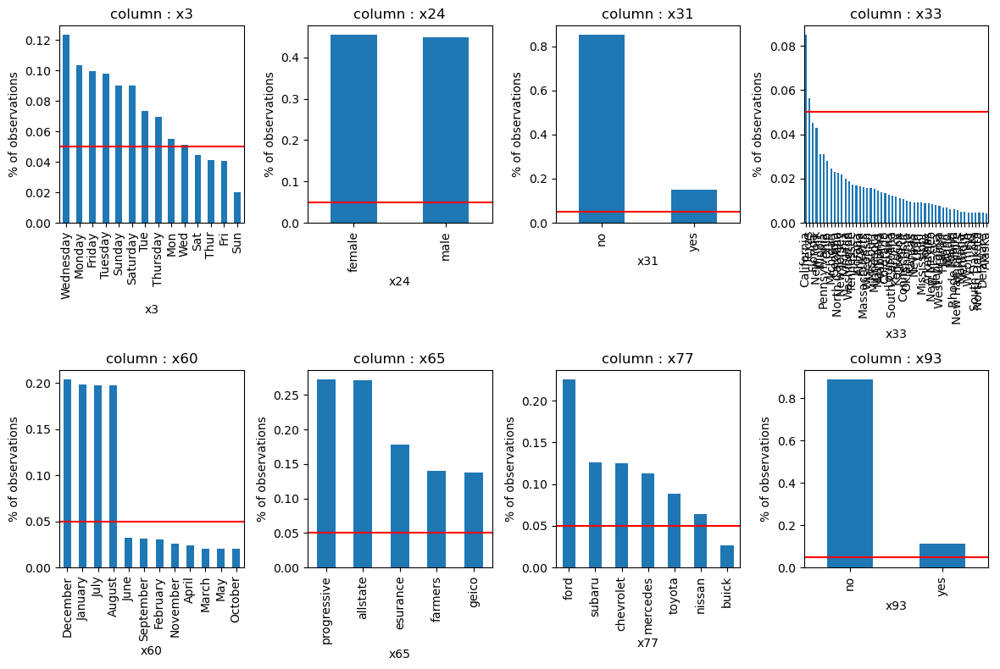

In [8]:
## Rare Label Check

def rareLabelCheck(data,cat_cols):
    a = 2  # number of rows
    b = 4  # number of columns
    c = 1  # initialize plot counter

    total_record = len(data)
    
    fig = plt.figure(figsize=(12,8))

    for col in cat_cols:

        temp_df = pd.Series(data[col].value_counts() / total_record)

        plt.subplot(a, b, c)
        plt.title('column : {}'.format(col))
        plt.xlabel(i)
        c = c + 1

        fig = temp_df.sort_values(ascending=False).plot.bar()
        fig.set_xlabel(col)

        # Add a line at 5 % to flag the threshold for rare categories.
        fig.axhline(y=0.05, color='red')
        fig.set_ylabel('% of observations')
    plt.tight_layout()
    plt.show()
    
cat_cols=['x3','x24','x31','x33','x60','x65','x77','x93']
rareLabelCheck(data,cat_cols)

- To handle rare labelling, I will group rare values under the same umbrella as 'Rare' or 'Others'. This way I will avoid domination of the highest label values over those features with lower labels. This way, I will not lose their collective impact on the target values as well.
- I see variables __"x60"__ and __"x77"__ need to have Rare label operation.

In [9]:
# Let's check whether "x59" and "x79" minority classes are subset of variable "y" minority class?
t = data[~(data['y']==1)]


print('Total # of minority class of x31 :', len(data[data['x31']=='yes']))
print('Total # of minority class of x93 :', len(data[data['x93']=='yes']))
print('\n')
print('When y=0:')
print('# of minority class of x31:',len(t[t['x31']=='yes']),'     |    # of majority class of x31-->',len(t[t['x31']=='no']))
print('# of minority class of x93 :',len(t[t['x93']=='yes']),'    |    # of majority class of x93-->',len(t[t['x93']=='no']))

Total # of minority class of x31 : 5978
Total # of minority class of x93 : 4494


When y=0:
# of minority class of x31: 5517      |    # of majority class of x31--> 28680
# of minority class of x93 : 4202     |    # of majority class of x93--> 29995


- Yes, most of the minority values of both variables place in y's majority class. I am keeping this in mind!!

- So far so good!! I completed categorical variables' characteristic checks. Now, it's time to jump to see how discrete and continous variables charachteristics look like.

### Discrete Variables Characteristics

In [10]:
data[discrete]

,y,x59,x79,x98
0,0,0,1.0,0
1,1,0,NaN,1
2,1,0,1.0,0
3,0,0,1.0,1
4,0,0,1.0,0
...,...,...,...,...
39995,0,0,1.0,1
39996,0,0,1.0,0
39997,0,0,1.0,1
39998,0,0,1.0,0


In [11]:
# Null Value Check

for i in discrete:
    print(i,'--->',data[i].isnull().sum(), '    %:', data[i].isnull().mean())

y ---> 0     %: 0.0
x59 ---> 0     %: 0.0
x79 ---> 2430     %: 0.06075
x98 ---> 0     %: 0.0


In [12]:
# Unique Value Check

for i in discrete:
    print('\n', i,'--->',data[i].unique(),'\n')


 y ---> [0 1] 


 x59 ---> [0 1] 


 x79 ---> [ 1. nan  0.] 


 x98 ---> [0 1] 



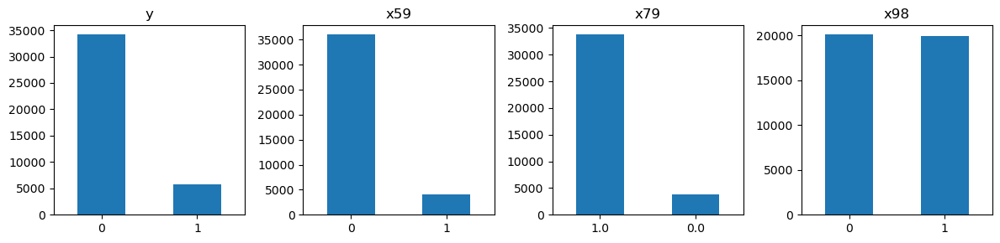

In [13]:
# Let's make bar chart to see frequency of observations per value for discrete variables.

df=data[discrete]
fig, axes = plt.subplots(figsize=(12,3), ncols=4, nrows=1)

for col, ax in zip(data[discrete].columns, np.ravel(axes)):
    data[col].value_counts().plot(kind='bar', ax=ax, rot=0, title=col)

plt.tight_layout()
plt.show()

- From the chart, I see the dataset imbalanced. I will need to apply an appropriate imbalanced operation - more likely undersampling- to balance the data. 

In [14]:
# Let's check whether "x59" and "x79" minority classes are subset of variable "y" minority class?
t = data[~(data['y']==1)]


print('Total # of minority class of x59 :', len(data[data['x59']==1]))
print('Total # of minority class of x79 :', len(data[data['x59']==1]))
print('\n')
print('When y=0:')
print('Minority class of x59 :',len(t[t['x59']==1]),'     |     Majority class of x59-->',len(t[t['x59']==0]))
print('Minority class of x79 :',len(t[t['x79']==0]),'     |     Majority class of x79-->',len(t[t['x79']==1]))

Total # of minority class of x59 : 3986
Total # of minority class of x79 : 3986


When y=0:
Minority class of x59 : 3411      |     Majority class of x59--> 30786
Minority class of x79 : 3228      |     Majority class of x79--> 28899


- Since the minority classes of "x59" & "x79" highly place in variable y's majority class (y=0) I should take into account that during the undersampling operation, I should not trim the observations where "x59" & "x79" minorities.


- I am going to apply undersampling technique on the training data set ONLY !! The details coming soon !! Keep in tuned.

### Continous Variables Characteristics

In [15]:
# Nul Value Check

null_continous_cols=[j for j in continuous if data[j].isnull().sum() >0]
for i in null_continous_cols:
    print(i,'-->',data[i].isnull().sum(), '  %', data[i].isnull().mean())

x5 --> 2428   % 0.0607
x11 --> 5110   % 0.12775
x14 --> 9864   % 0.2466
x16 --> 11212   % 0.2803
x22 --> 2387   % 0.059675
x26 --> 2433   % 0.060825
x30 --> 32336   % 0.8084
x38 --> 2402   % 0.06005
x41 --> 9503   % 0.237575
x42 --> 9729   % 0.243225
x44 --> 34247   % 0.856175
x45 --> 8009   % 0.200225
x49 --> 12823   % 0.320575
x52 --> 16182   % 0.40455
x54 --> 12728   % 0.3182
x55 --> 17696   % 0.4424
x57 --> 32464   % 0.8116
x61 --> 7293   % 0.182325
x63 --> 2420   % 0.0605
x64 --> 5101   % 0.127525
x67 --> 2425   % 0.060625
x68 --> 2384   % 0.0596
x74 --> 12916   % 0.3229
x75 --> 5245   % 0.131125
x76 --> 5249   % 0.131225
x78 --> 11373   % 0.284325
x80 --> 5256   % 0.1314
x83 --> 2428   % 0.0607
x85 --> 9715   % 0.242875
x86 --> 2407   % 0.060175
x88 --> 2331   % 0.058275
x89 --> 10691   % 0.267275
x91 --> 5259   % 0.131475
x92 --> 2435   % 0.060875
x94 --> 2340   % 0.0585
x95 --> 12604   % 0.3151
x96 --> 6638   % 0.16595


Variables have highly missing values:
- "x30": %80, 
- "x44": %85, 
- "x57": %81

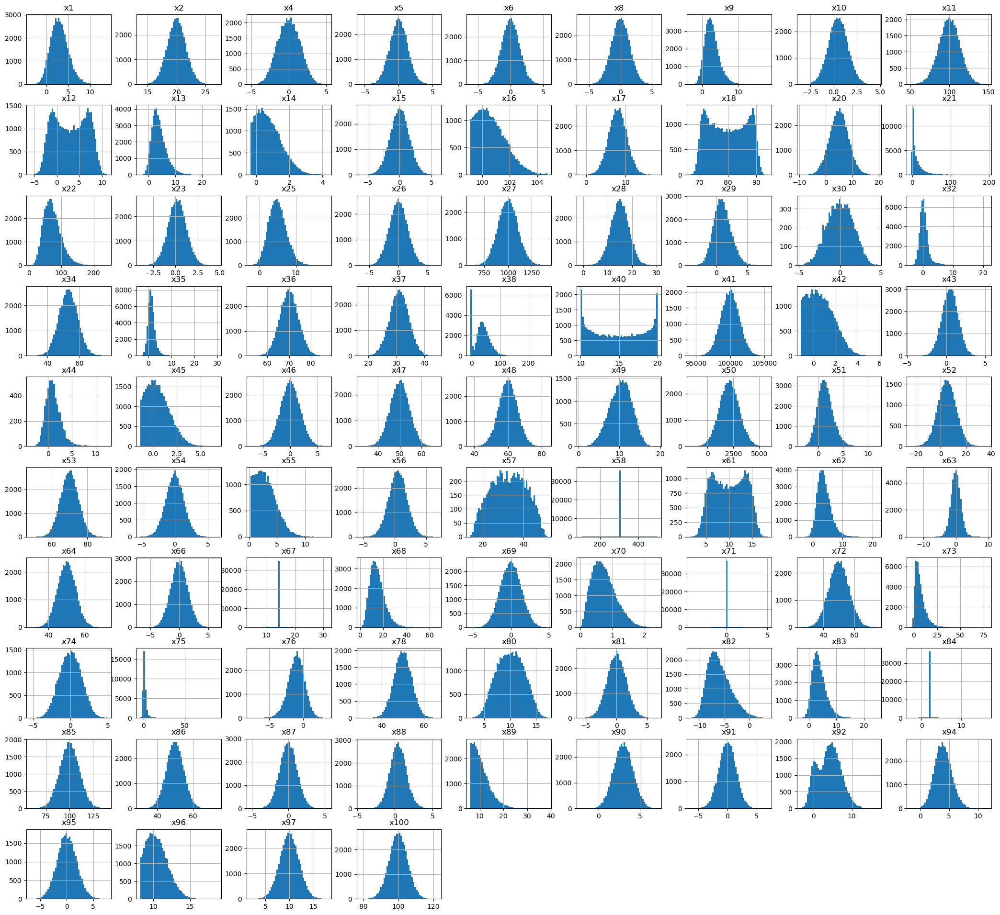

In [16]:
# Plot variable distributions

data[continuous].hist(bins=50, figsize=(26, 24))
plt.show()

- I am using histogram to determine if the variable is normally distributed. These plots help me to see which variables hold outliers(skewed graphs) and which ones need variable transformation.
- There are roughly 36 not normaly distributed features. 

## 3. Data Cleaning 

### 3.1 Missing Values

##### Missing Category Imputation

In [17]:
for i in categorical:
    print(i,'--->',data[i].isnull().sum(), '    %:', data[i].isnull().mean())

x3 ---> 0     %: 0.0
x7 ---> 0     %: 0.0
x19 ---> 0     %: 0.0
x24 ---> 3856     %: 0.0964
x31 ---> 0     %: 0.0
x33 ---> 7171     %: 0.179275
x39 ---> 0     %: 0.0
x60 ---> 0     %: 0.0
x65 ---> 0     %: 0.0
x77 ---> 9257     %: 0.231425
x93 ---> 0     %: 0.0
x99 ---> 12836     %: 0.3209


- First, I want to check whether the missing values of these variables were introduced systematically. In other word, if the missing values at random or not at random 

In [18]:
t = data[~data['x24'].isnull()]
print('x33:', t['x33'].isnull().mean())
print('x77:', t['x77'].isnull().mean())

x33: 0.17917220008853474
x77: 0.23104803010181496


In [19]:
t = data[~data['x33'].isnull()]
print('x77:', t['x77'].isnull().mean())

x77: 0.22915714764385148


<br>As I see, the missing values of those variables have not any correlation each other. They are random.<br>

- For "x24", I will remove the missing values.
- For "x33" and "x77", I will use missing category imputation from feature-engine library. The method I will use treats missing data
as an additional category of the variable. They will grouped under the created label "Missing". 
The beauty of this technique resides in the fact that it does not assume anything about the fact that the data is missing. It is very well suited when the number of missing data points is high.

In [20]:
# Drop missing values from x24
data_t=data.dropna(subset=['x24'])

In [21]:
# Apply CategoricalImputation to rest of the other missing variables.
imputer = CategoricalImputer()
imputer.fit(data_t)

CategoricalImputer()

In [22]:
imputer.variables_

['x3',
 'x7',
 'x19',
 'x24',
 'x31',
 'x33',
 'x39',
 'x60',
 'x65',
 'x77',
 'x93',
 'x99']

In [23]:
data_tt=imputer.transform(data_t)
data_tt

,y,x1,x2,x3,x4,x5,x6,x7,x8,x9,...,x91,x92,x93,x94,x95,x96,x97,x98,x99,x100
0,0,0.165254,18.060003,Wed,1.077380,-1.339233,-1.584341,0.0062%,0.220784,1.816481,...,-0.397427,0.909479,no,5.492487,NaN,10.255579,7.627730,0,yes,104.251338
1,1,2.441471,18.416307,Friday,1.482586,0.920817,-0.759931,0.0064%,1.192441,3.513950,...,0.656651,9.093466,no,3.346429,4.321172,NaN,10.505284,1,yes,101.230645
2,1,4.427278,19.188092,Thursday,0.145652,0.366093,0.709962,-8e-04%,0.952323,0.782974,...,2.059615,0.305170,no,4.456565,NaN,8.754572,7.810979,0,yes,109.345215
3,0,3.925235,19.901257,Tuesday,1.763602,-0.251926,-0.827461,-0.0057%,-0.520756,1.825586,...,0.899392,5.971782,no,4.100022,1.151085,NaN,9.178325,1,yes,103.021970
4,0,2.868802,22.202473,Sunday,3.405119,0.083162,1.381504,0.0109%,-0.732739,2.151990,...,3.003595,1.046096,yes,3.234033,2.074927,9.987006,11.702664,0,yes,92.925935
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39993,0,1.946843,19.476898,Tuesday,-1.112291,NaN,0.546357,0.019%,2.771247,3.267186,...,0.800448,2.894433,yes,5.049483,-2.326683,10.749163,8.792128,0,yes,98.295808
39995,0,1.593480,19.628352,Sun,0.794697,-0.825849,0.608774,-0.0085%,2.183834,3.202119,...,-1.640259,5.051545,no,5.798509,NaN,10.854903,9.505529,1,yes,98.855726
39996,0,1.708685,17.132638,Thursday,-2.676659,1.153851,0.465905,0.0077%,-0.048613,3.989567,...,-0.195783,2.020510,no,5.285345,-1.408117,8.867221,9.077493,0,yes,101.880335
39997,0,1.704132,17.824399,Monday,-0.581360,NaN,0.467339,-0.0216%,0.904643,2.975563,...,-0.071581,6.250353,no,4.729509,-1.118486,12.244620,7.663763,1,yes,100.022536


In [24]:
# let's check the categorical variables to see if there is any missing values
data_tt[imputer.variables_].isnull().mean()

x3     0.0
x7     0.0
x19    0.0
x24    0.0
x31    0.0
x33    0.0
x39    0.0
x60    0.0
x65    0.0
x77    0.0
x93    0.0
x99    0.0
dtype: float64

In [25]:
print('Number of observations before missing value imputation: ',len(data.index))
print('Number of observations after missing value imputation: ',len(data_tt.index))

Number of observations before missing value imputation:  40000
Number of observations after missing value imputation:  36144


##### Discrete Variable Imputation

In [26]:
for i in discrete:
    print(i,'--->',data_tt[i].isnull().sum(), '    %:', data_tt[i].isnull().mean())

y ---> 0     %: 0.0
x59 ---> 0     %: 0.0
x79 ---> 2202     %: 0.06092297476759628
x98 ---> 0     %: 0.0


- Since the missing data percentage is low, instead of taking the risk of making noise with imputation of those less missing values, I prefer removing them from the dataset.

In [27]:
data_tt.dropna(subset=['x79'], inplace=True)

In [28]:
# let's check the categorical variables to see if there is any missing values
data_tt[discrete].isnull().mean()

y      0.0
x59    0.0
x79    0.0
x98    0.0
dtype: float64

##### Continous Variable Imputation

In [29]:
null_continous_cols=[j for j in continuous if data_tt[j].isnull().sum() >0]
for i in null_continous_cols:
    print(i,'-->',data_tt[i].isnull().sum(), '  %', round(data_tt[i].isnull().mean(),3))

x5 --> 2047   % 0.06
x11 --> 4334   % 0.128
x14 --> 8380   % 0.247
x16 --> 9539   % 0.281
x22 --> 2036   % 0.06
x26 --> 2032   % 0.06
x30 --> 27461   % 0.809
x38 --> 2047   % 0.06
x41 --> 8089   % 0.238
x42 --> 8200   % 0.242
x44 --> 29044   % 0.856
x45 --> 6752   % 0.199
x49 --> 10892   % 0.321
x52 --> 13718   % 0.404
x54 --> 10786   % 0.318
x55 --> 14921   % 0.44
x57 --> 27549   % 0.812
x61 --> 6156   % 0.181
x63 --> 2074   % 0.061
x64 --> 4333   % 0.128
x67 --> 2074   % 0.061
x68 --> 2010   % 0.059
x74 --> 10988   % 0.324
x75 --> 4454   % 0.131
x76 --> 4473   % 0.132
x78 --> 9612   % 0.283
x80 --> 4472   % 0.132
x83 --> 2025   % 0.06
x85 --> 8221   % 0.242
x86 --> 2034   % 0.06
x88 --> 1984   % 0.058
x89 --> 9069   % 0.267
x91 --> 4456   % 0.131
x92 --> 2059   % 0.061
x94 --> 1990   % 0.059
x95 --> 10680   % 0.315
x96 --> 5618   % 0.166


<br>Roadmap for the missing continuous variables:<br>
- There are %40-%85 of variable observations are missing in the dataset. Those are 'x30','x44','x52','x55','x57'. I will remove variables have highly missing %40-%85 due to those provide no useful information to the model. 
- I will use dropna() for those variables having less than %5 of missing values.
- For the rest (%5-%40), I will apply imputation techniques. They will be filled with **mean** value if the variable distributed normally, otherwise **median** because it is skewed.

In [30]:
# Droping the columns that are missing values between %40-80
data_x=data_tt.drop(['x30','x44','x57'],axis=1)

In [31]:
# Imputation for normally distributed variables
imputer_mean = mdi.MeanMedianImputer(
                                    imputation_method="mean",
                                    variables=["x5","x26", "x52","x63","x86","x88","x94","x11","x41",
                                               "x49","x54","x61","x64","x74","x80","x85","x91","x95"]
                                 )

imputer_mean.fit(data_x)
data_xx = imputer_mean.transform(data_x)

In [32]:
# Imputation for skewed distributed variables
imputer_median = mdi.MeanMedianImputer(
                                    imputation_method="median",
                                    variables=["x22","x38","x55","x67","x68","x83","x92","x14",
                                               "x16","x42","x45","x75","x76","x78","x89","x96"]
                                 )

imputer_median.fit(data_xx)
data_null = imputer_median.transform(data_xx)

In [33]:
print("Number of the observations before missing value imputation: ", len(data_tt))
print("Number of the observations after missing value imputation: ", len(data_null))

Number of the observations before missing value imputation:  33942
Number of the observations after missing value imputation:  33942


- I only remove the columns where the highly missing values being observed. For the rest of the data I just applied mean/median imputation

### 3.2 Cardinality & Rare Label Transformations

In [34]:
## Issue 1: Variable 'x3' needs to be cleaned

In [35]:
data_null['x3'].unique()

array(['Wed', 'Thursday', 'Tuesday', 'Sunday', 'Saturday', 'Sat',
       'Wednesday', 'Friday', 'Tue', 'Monday', 'Fri', 'Thur', 'Sun',
       'Mon'], dtype=object)

In [36]:
map_days={'Mon':'Monday',
          'Monday':'Monday',
          'Tue':'Tuesday',
          'Tuesday':'Tuesday',
          'Wed':'Wednesday',
          'Wednesday':'Wednesday',
          'Thur':'Thursday',
          'Thursday':'Thursday',
          'Fri':'Friday',
          'Friday': 'Friday',
          'Sat':'Saturday',
          'Saturday':'Saturday',
          'Sun':'Sunday',
          'Sunday':'Sunday' 
         }

In [37]:
data_null['cleaned_x3']=data_null['x3'].map(map_days)
data_null.drop(['x3'],axis=1,inplace=True)

In [38]:
## Issue 2: Variables 'x7' & 'x19' need to be cleaned from special charachters and considered as continous variables

In [39]:
data_null[['x7','x19']]

,x7,x19
0,0.0062%,$-908.650758424405
2,-8e-04%,$-543.187402955527
3,-0.0057%,$-182.626380634258
4,0.0109%,$967.007090837503
5,0.0079%,$271.163475698959
...,...,...
39993,0.019%,$2137.11401146627
39995,-0.0085%,$3750.51991954505
39996,0.0077%,$448.867118077561
39997,-0.0216%,$834.95775080472


In [40]:
data_null['cleaned_x7']=data_null['x7'].str[:-1]
data_null['cleaned_x19']=data_null['x19'].str[1:]

In [41]:
data_null[['x7','x19','cleaned_x7','cleaned_x19']]

,x7,x19,cleaned_x7,cleaned_x19
0,0.0062%,$-908.650758424405,0.0062,-908.650758424405
2,-8e-04%,$-543.187402955527,-8e-04,-543.187402955527
3,-0.0057%,$-182.626380634258,-0.0057,-182.626380634258
4,0.0109%,$967.007090837503,0.0109,967.007090837503
5,0.0079%,$271.163475698959,0.0079,271.163475698959
...,...,...,...,...
39993,0.019%,$2137.11401146627,0.019,2137.11401146627
39995,-0.0085%,$3750.51991954505,-0.0085,3750.51991954505
39996,0.0077%,$448.867118077561,0.0077,448.867118077561
39997,-0.0216%,$834.95775080472,-0.0216,834.95775080472


In [42]:
data_null[['cleaned_x7','cleaned_x19']] = data_null[['cleaned_x7','cleaned_x19']].astype('float')
data_null.drop(['x7','x19'],axis=1,inplace=True)

In [43]:
## Issue 3: Variable 'x33' is highly cardinal. 

I am going to apply some transformation to group them under region instead of states. That will reduce the column's number of labels

In [44]:
states_to_regions = {
    'Washington': 'West', 'Oregon': 'West', 'California': 'West', 'Nevada': 'West',
    'Idaho': 'West', 'Montana': 'West', 'Wyoming': 'West', 'Utah': 'West',
    'Colorado': 'West', 'Alaska': 'West', 'Hawaii': 'West', 'Maine': 'Northeast',
    'Vermont': 'Northeast', 'New York': 'Northeast', 'DC': 'Northeast','New Hampshire': 'Northeast',
    'Massachusetts': 'Northeast', 'Rhode Island': 'Northeast', 'Connecticut': 'Northeast',
    'New Jersey': 'Northeast', 'Pennsylvania': 'Northeast', 'North Dakota': 'Midwest',
    'South Dakota': 'Midwest', 'Nebraska': 'Midwest', 'Kansas': 'Midwest',
    'Minnesota': 'Midwest', 'Iowa': 'Midwest', 'Missouri': 'Midwest', 'Wisconsin': 'Midwest',
    'Illinois': 'Midwest', 'Michigan': 'Midwest', 'Indiana': 'Midwest', 'Ohio': 'Midwest',
    'West Virginia': 'South', 'District of Columbia': 'South', 'Maryland': 'South',
    'Virginia': 'South', 'Kentucky': 'South', 'Tennessee': 'South', 'North Carolina': 'South',
    'Mississippi': 'South', 'Arkansas': 'South', 'Louisiana': 'South', 'Alabama': 'South',
    'Georgia': 'South', 'South Carolina': 'South', 'Florida': 'South', 'Delaware': 'South',
    'Arizona': 'Southwest', 'New Mexico': 'Southwest', 'Oklahoma': 'Southwest',
    'Texas': 'Southwest'}

In [45]:
region=[]
for i in data_null.index:
    if data_null.loc[i,'x33'] in states_to_regions:
        region.append(states_to_regions[data_null.loc[i,'x33']])
    if data_null.loc[i,'x33'] =='Missing':
        region.append('Missing')
        
data_null['cleaned_x33']=region

In [46]:
data_null[['x33','cleaned_x33']].head()

,x33,cleaned_x33
0,Colorado,West
2,Texas,Southwest
3,Minnesota,Midwest
4,New York,Northeast
5,Florida,South


In [47]:
# Remove x33
data_null.drop(['x33'],axis=1,inplace=True)

In [48]:
## Issue 4: Since variables 'x39' & 'x99' hold only one value, they provide no useful information to the model,
## I am going to remove them.

data_c=data_null.drop(['x39','x99'], axis=1)

In [49]:
data_c.dtypes

y                int64
x1             float64
x2             float64
x4             float64
x5             float64
                ...   
x100           float64
cleaned_x3      object
cleaned_x7     float64
cleaned_x19    float64
cleaned_x33     object
Length: 96, dtype: object

In [50]:
## Issue 5: 'x60' has rare labels. I am going to group those rare labels under the same group as "Rare".
rare_label=ce.RareLabelEncoder(tol=0.05,n_categories=4,variables=['x60'])

rare_label.fit(data_c)
data_rare = rare_label.transform(data_c)

- Let's see how our categorical variables look like after the feature engineering processed we just applied.

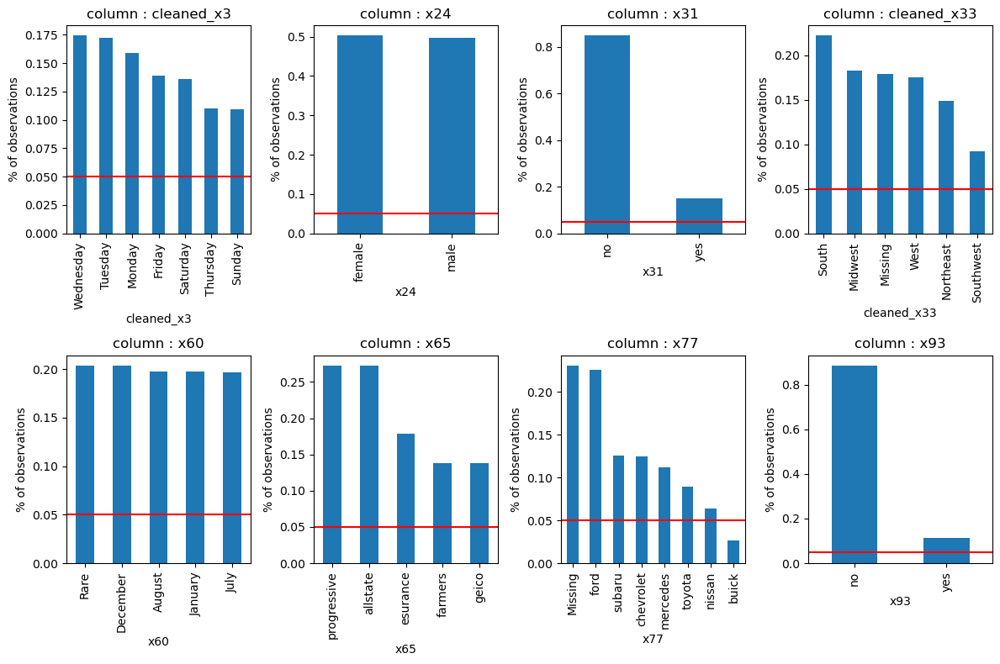

In [51]:
# Plot the number of observation per values of each column
cat_cols=['cleaned_x3','x24','x31','cleaned_x33','x60','x65','x77','x93']
rareLabelCheck(data_rare,cat_cols)

- I still see **'x31' and 'x93'** highly imbalanced. Let's see if those variables' imbalance is related to y (target) variable's imbalance. That is to say, let's check whether there is any correlation between 'y' column's imbalance and 'x31' & 'x93' imbalance.
If yes than we do not need to do anything for those 2 columns since they will get resolved during the undersampling operation.

In [52]:
# I am checking 'x31'=='yes' and 'x93'=='yes' are subset of 'y'==1 proportion of the data.
t = data_rare[(data_rare['y']==1)]
t[t['x31']=='no']
t[t['x93']=='no']

,y,x1,x2,x4,x5,x6,x8,x9,x10,x11,...,x94,x95,x96,x97,x98,x100,cleaned_x3,cleaned_x7,cleaned_x19,cleaned_x33
2,1,4.427278,19.188092,0.145652,0.366093,0.709962,0.952323,0.782974,-1.247022,95.375221,...,4.456565,0.029154,8.754572,7.810979,0,109.345215,Thursday,-0.0008,-543.187403,Southwest
10,1,0.853152,20.300924,-0.930155,0.003016,-0.289608,-0.040689,1.858641,1.491314,112.967794,...,3.739497,-0.366274,9.308785,7.521564,0,104.726967,Wednesday,-0.0052,1391.302605,Midwest
17,1,5.947705,19.162528,-2.144201,-0.542866,0.730314,1.052837,2.220867,-1.169024,100.009264,...,0.946833,2.916130,10.745717,10.352302,0,99.777292,Monday,0.0066,-1036.273526,South
21,1,4.215208,23.639019,-0.656848,-1.502235,2.071008,-0.091270,5.729263,-0.222634,129.663526,...,2.038630,0.612237,10.357075,6.742927,0,104.129082,Tuesday,0.0023,-26.665690,Midwest
22,1,2.420340,18.407849,0.328577,1.145184,0.069740,-0.762970,2.166202,-0.250974,106.055689,...,4.231478,0.029154,9.887076,11.489041,1,108.011031,Saturday,-0.0023,-1569.344396,Northeast
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39978,1,0.107007,19.923724,0.173163,0.285757,0.617252,-1.917371,3.942427,1.623874,107.549061,...,6.002824,1.527734,9.982108,12.568809,0,102.865937,Sunday,-0.0228,471.654828,South
39981,1,1.197245,23.788463,0.825953,-2.711441,1.520180,0.318255,3.643937,-0.334958,86.480456,...,3.863975,-1.996217,12.142465,12.024445,1,101.884783,Saturday,0.0034,-695.467902,Missing
39983,1,0.213305,18.705062,-0.810993,-2.157335,1.454130,-1.840749,2.802803,1.619771,100.009264,...,4.134381,3.043938,10.020054,9.536428,1,94.265523,Sunday,0.0147,-1535.822591,West
39984,1,4.418857,20.358075,0.377529,-0.333573,0.538326,1.889357,0.559557,1.206833,100.009264,...,1.670576,-0.571133,10.526262,9.146870,1,96.791061,Wednesday,-0.0212,-959.862150,Northeast


<br>No they are not related. So, I need to pay attention to not lose more of observations from those variables during the undersampling..One option is if the features 'x31' and 'x93' are not highly correlated to the dependent variable, we can drop it. <br>

- From now on, all the feature engineerings will be applied for only continuous variables

### 3.3  Outlier Detection

Since I am going to use logistic regression as baseline model first, and it is highly sensitive to outliers, I need to handle outliers in this section

In [53]:
def diagnostic_plots(df, variable):
    # function takes a dataframe (df) and
    # the variable of interest as arguments

    # define figure size
    plt.figure(figsize=(16, 4))

    # histogram
    plt.subplot(1, 3, 1)
    sns.histplot(df[variable], bins=30)
    plt.title('Histogram')

    # Q-Q plot
    plt.subplot(1, 3, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.ylabel('Variable quantiles')

    # boxplot
    plt.subplot(1, 3, 3)
    sns.boxplot(y=df[variable])
    plt.title('Boxplot')

    plt.show()

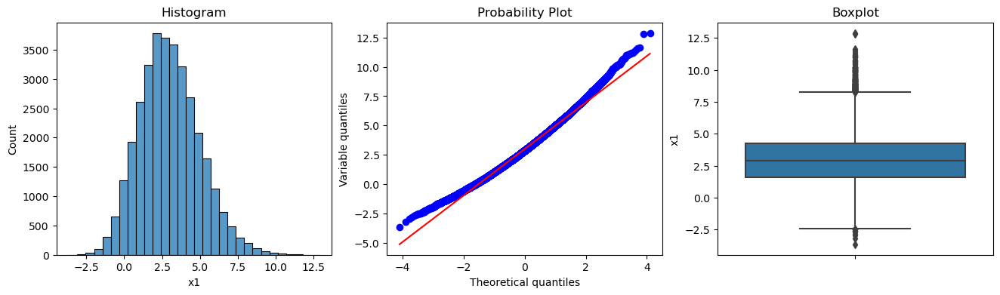

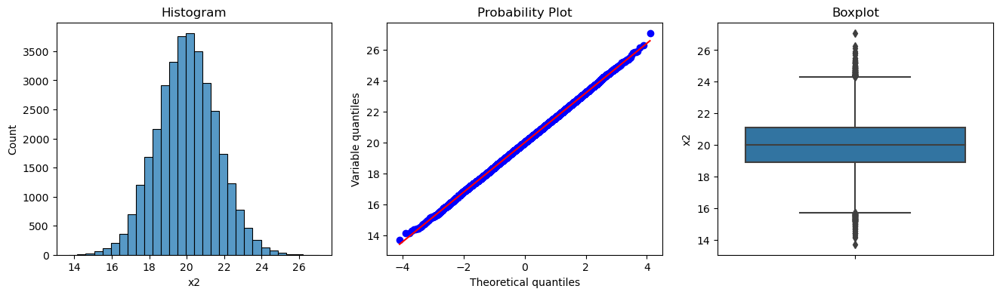

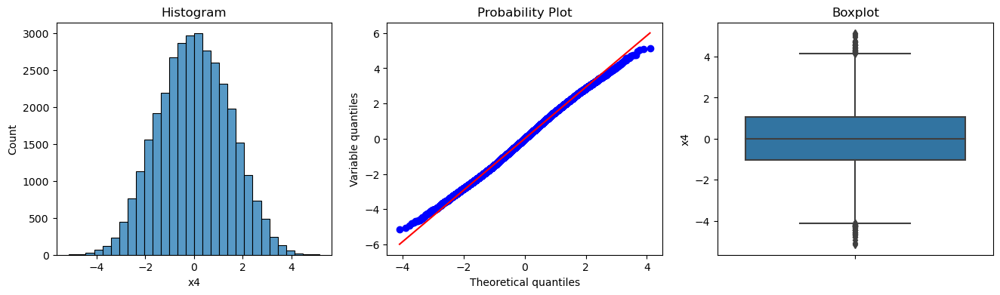

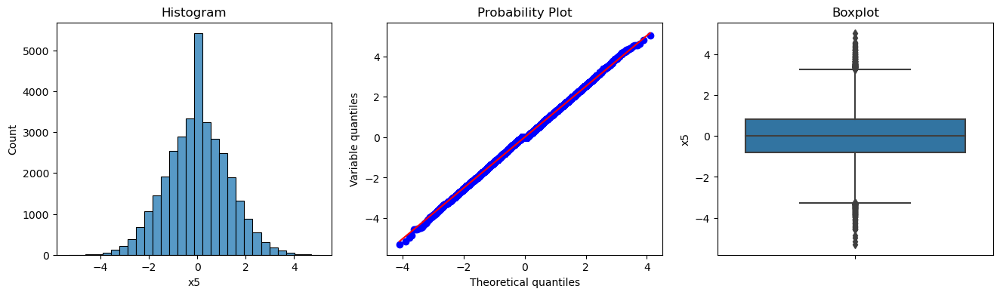

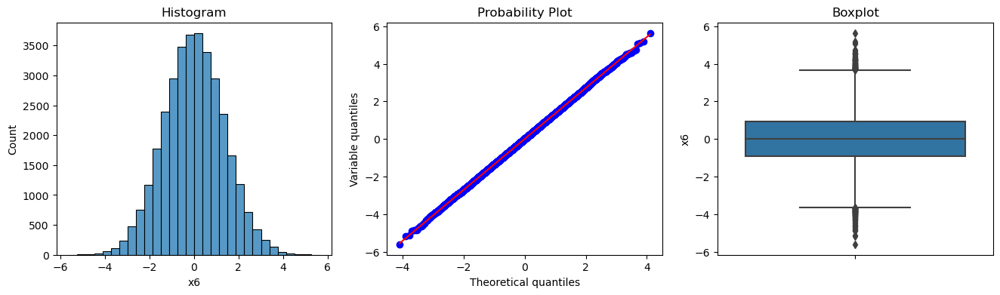

...

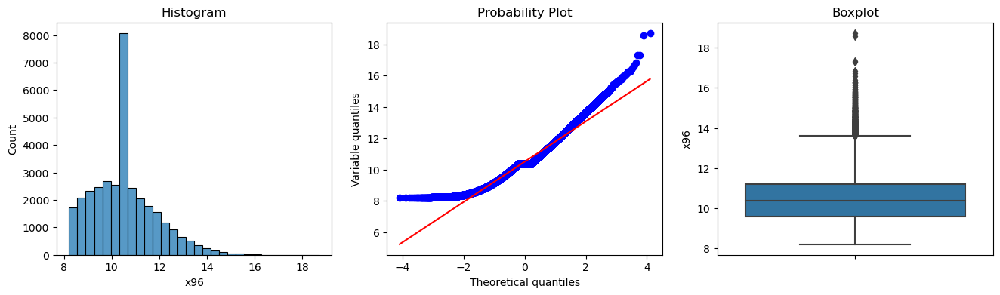

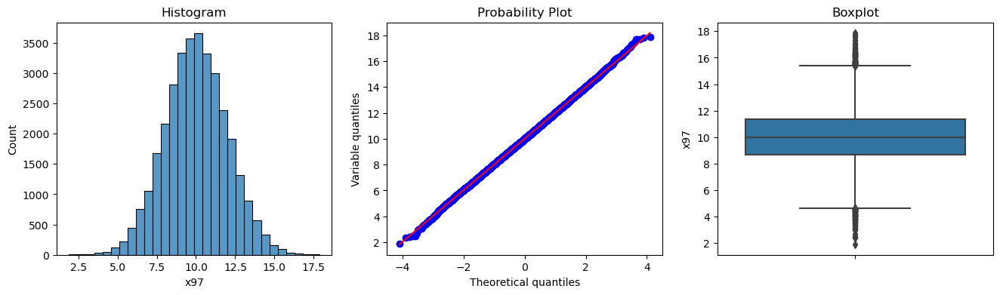

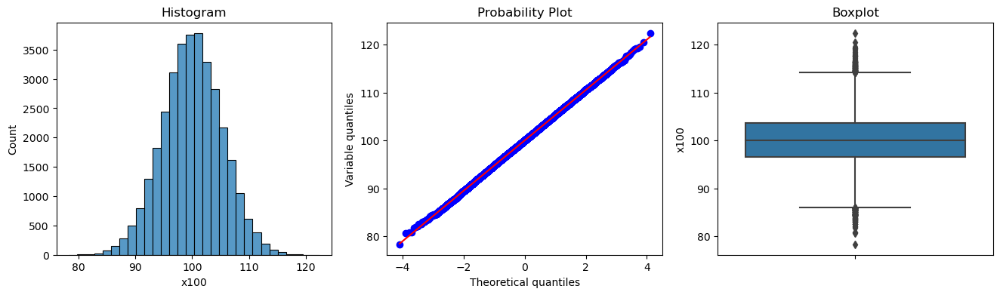

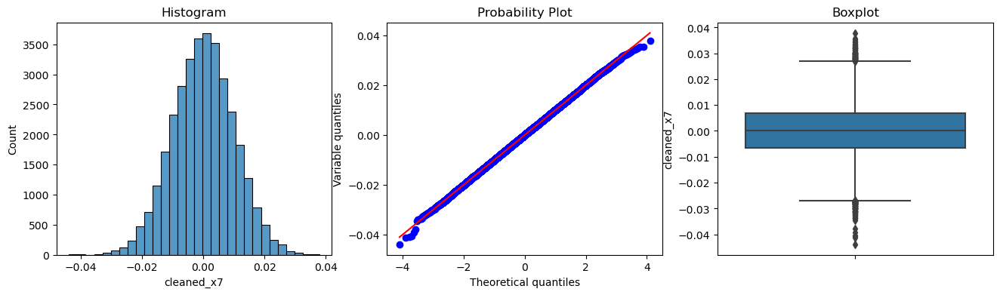

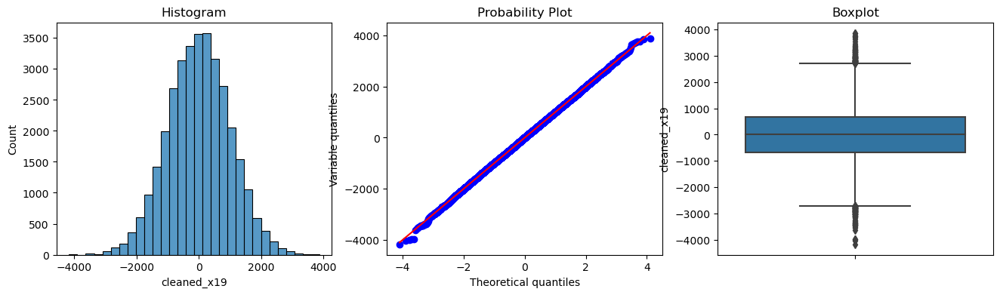

In [54]:
# Let's plot charts to see outliers and distribution of each variable
continuous= [var for var in data_rare.columns if data_rare[var].dtype!='O' and var not in discrete]
for i in data_rare[continuous]:
    diagnostic_plots(data_rare, i)

- In normally distributed variables , outliers are those values that lie beyond the mean, plus or minus 3 times the standard deviation. If the variables are skewed, however, we find outliers using the inter-quantile range. In order to decide which method to use to detect outliers, we first need to know the distribution of the variable.

- From the charts above we can use histogram and Q-Q plots to say whether a variable normally distributed or not.
The variables have alignment of the blue dots along with the red line in Q-Q chart are normally distributed.

- 'x58','x67','x71', 'x75', 'x84' are having lots of outliers. 

In [55]:
# Thank to the histogram and probability plots above, I am defining normal distributed and skewed variables into 
# different 2 categories.

continuous_gaussian=['x1','x2','x4','x5','x6','x8','x10','x11','x15','x17','x20','x23',
                     'x25','x26','x27','x28','x29','x34','x36','x37','x41','x43','x46','x47',
                     'x48','x49','x50','x52','x53','x54','x56','x64','x66','x69','x72','x74','x78',
                     'x80','x81','x85','x86','x87','x88','x90','x91','x94','x95','x97','x100',
                     'cleaned_x7', 'cleaned_x19']
continuous_quantiles=  [i for i in continuous if i not in continuous_gaussian]

##### Outlier detection for normally distributed variables

In [56]:
# Outlier detection for normally distributed variables

def find_normal_boundaries(df, variable):

    # Calculate the boundaries
    # for a Gaussian distribution.

    upper_boundary = df[variable].mean() + 3 * df[variable].std()
    lower_boundary = df[variable].mean() - 3 * df[variable].std()

    return upper_boundary, lower_boundary

In [57]:
# Let's flag the outliers in the data set

dd_gaussian=[]

for col in data_rare[continuous_gaussian].columns:
    upper_boundary, lower_boundary = find_normal_boundaries(data_rare, col)
    
    colname='outlier_'+ col 
    colname= np.where(data_rare[col] > upper_boundary, True,
             np.where(data_rare[col] < lower_boundary, True, False))
    dd_gaussian.append(colname)

In [58]:
result_gaussian=np.array(dd_gaussian)

##### Outlier detection for skewed variables

In [59]:
def find_skewed_boundaries(df, variable, distance):

    # Let's calculate the boundaries outside which sit the outliers
    # for skewed distributions

    # distance passed as an argument, gives us the option to
    # estimate 1.5 times or 3 times the IQR to calculate
    # the boundaries.

    IQR = df[variable].quantile(0.75) - df[variable].quantile(0.25)

    lower_boundary = df[variable].quantile(0.25) - (IQR * distance)
    upper_boundary = df[variable].quantile(0.75) + (IQR * distance)

    return upper_boundary, lower_boundary

In [60]:
# Let's flag the outliers in the data set

dd_skewed=[]

for col in data_rare[continuous_quantiles].columns:
    RM_upper_limit, RM_lower_limit = find_skewed_boundaries(data_rare, col, 1.5)
    
    colname='outlier_'+ col 
    colname = np.where(data_rare[col] > RM_upper_limit, True,
              np.where(data_rare[col] < RM_lower_limit, True, False))
    dd_skewed.append(colname)

In [61]:
# Converting list to numpy array. Then, I will remove the flagged values from the dataset

arr_skewed=np.array(dd_skewed)

print('There are :',len(result_gaussian),' normally distributed variables that are holding outliers ')
print('There are :',len(arr_skewed),' skewed variables that are holding outliers ')


There are : 51  normally distributed variables that are holding outliers 
There are : 33  skewed variables that are holding outliers 


In [62]:
# Let's trim the dataset
data_trimmed = data_rare.loc[~(result_gaussian[0]+result_gaussian[1]+result_gaussian[2]+result_gaussian[3]+
                               result_gaussian[4]+result_gaussian[5]+result_gaussian[6]+result_gaussian[7]+
                               result_gaussian[8]+result_gaussian[9]+result_gaussian[10]+result_gaussian[11]+
                               result_gaussian[12]+result_gaussian[13]+result_gaussian[14]+result_gaussian[15]+
                               result_gaussian[16]+result_gaussian[17]+result_gaussian[18]+result_gaussian[19]+
                               result_gaussian[20]+result_gaussian[21]+result_gaussian[22]+result_gaussian[23]+
                               result_gaussian[24]+result_gaussian[25]+result_gaussian[26]+result_gaussian[27]+
                               result_gaussian[28]+result_gaussian[29]+result_gaussian[30]+result_gaussian[31]+
                               result_gaussian[32]+result_gaussian[33]+result_gaussian[34]+result_gaussian[35]+
                               result_gaussian[36]+result_gaussian[37]+result_gaussian[38]+result_gaussian[39]+
                               result_gaussian[40]+result_gaussian[41]+result_gaussian[42]+result_gaussian[43]+
                               result_gaussian[44]+result_gaussian[45]+result_gaussian[46]+result_gaussian[47]+
                               result_gaussian[48]+result_gaussian[49]+result_gaussian[50]+arr_skewed[0]+arr_skewed[1]+arr_skewed[2]+
                               arr_skewed[3]+arr_skewed[4]+arr_skewed[5]+arr_skewed[6]+arr_skewed[7]+arr_skewed[8]+
                               arr_skewed[9]+arr_skewed[10]+arr_skewed[11]+arr_skewed[12]+arr_skewed[13]+
                               arr_skewed[14]+arr_skewed[15]+arr_skewed[16]+arr_skewed[17]+arr_skewed[18]+
                               arr_skewed[19]+arr_skewed[20]+arr_skewed[21]+arr_skewed[22]+arr_skewed[23]+
                               arr_skewed[24]+arr_skewed[25]+arr_skewed[26]+arr_skewed[27]+arr_skewed[28]+
                               arr_skewed[29]+arr_skewed[30]+arr_skewed[31]+arr_skewed[32]) ]
data_rare.shape, data_trimmed.shape 

((33942, 96), (7052, 96))

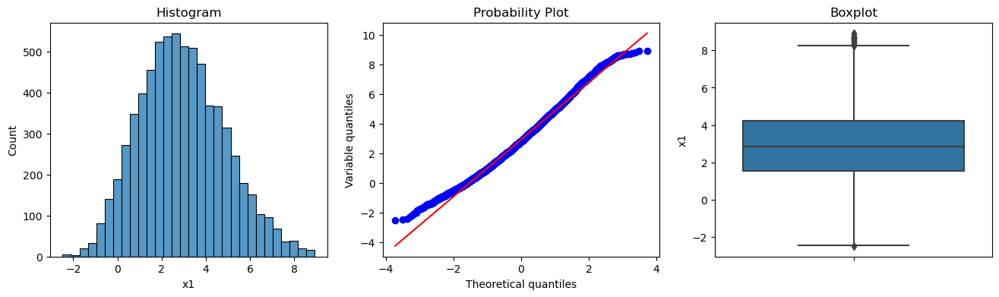

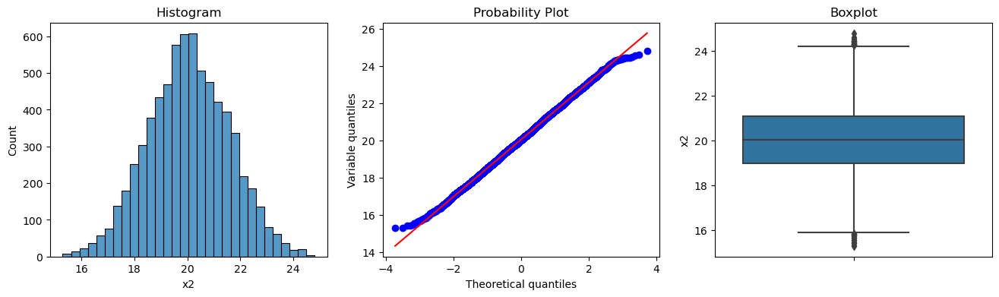

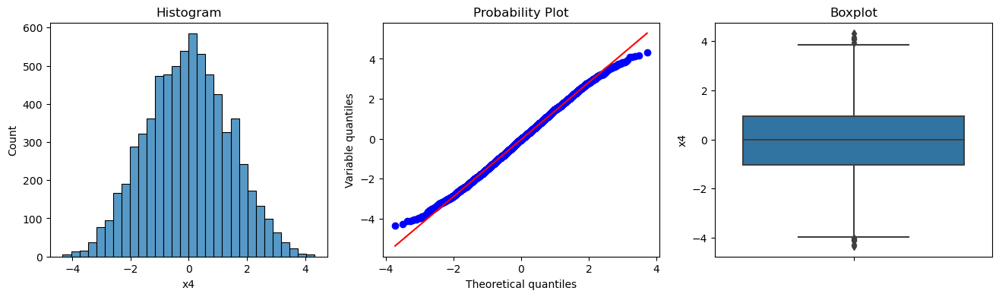

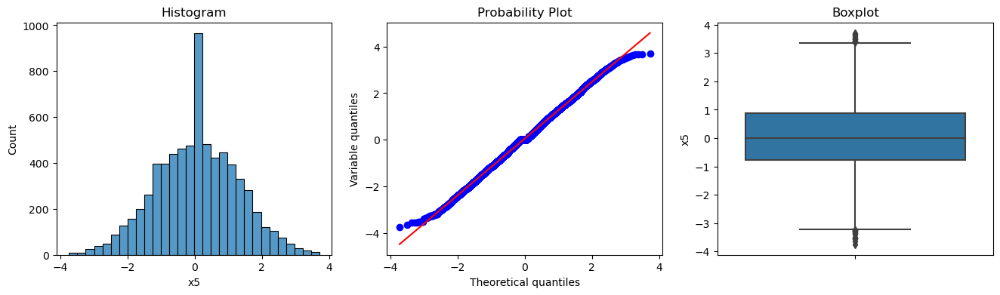

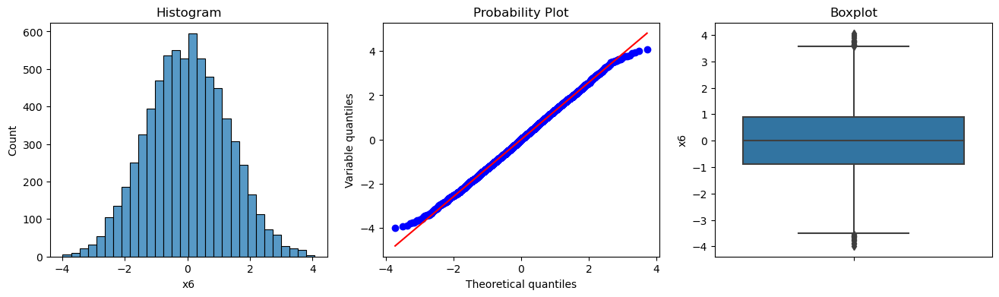

...

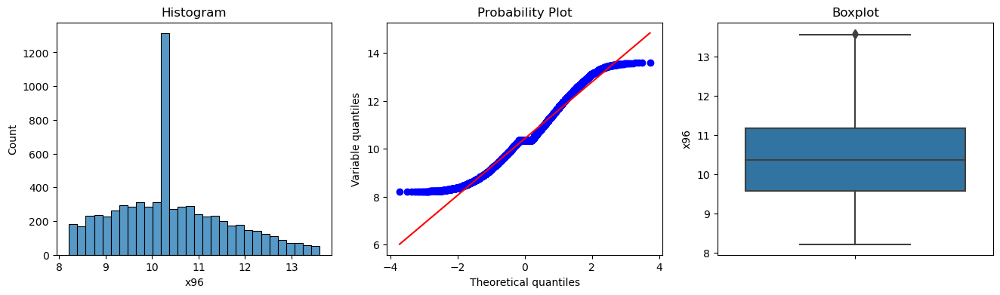

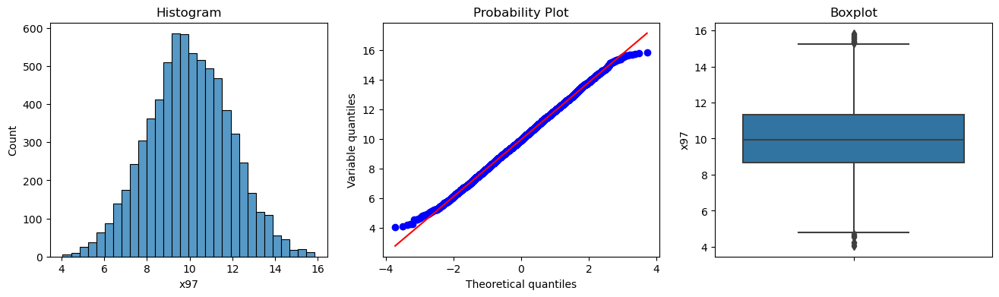

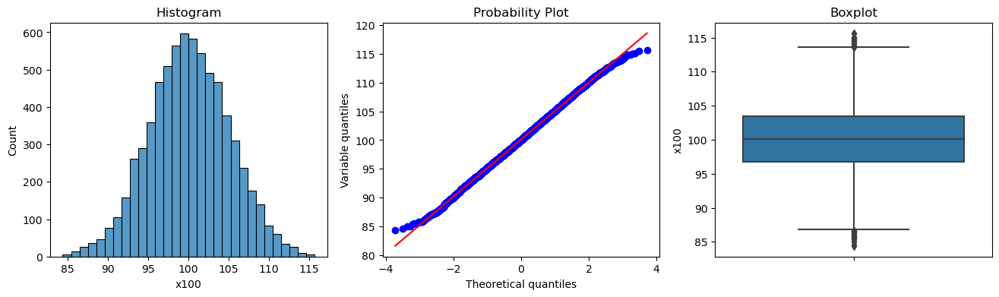

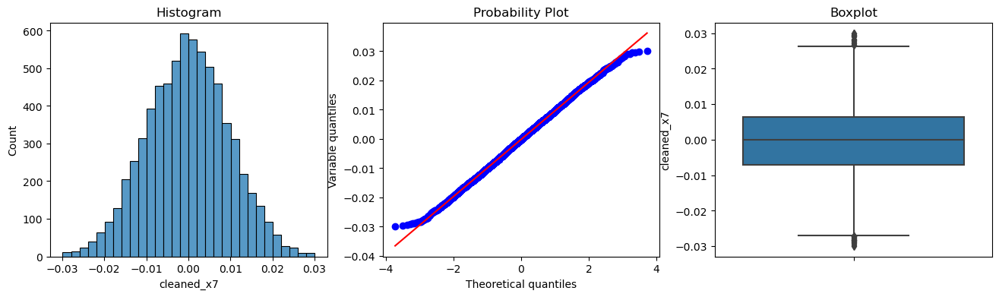

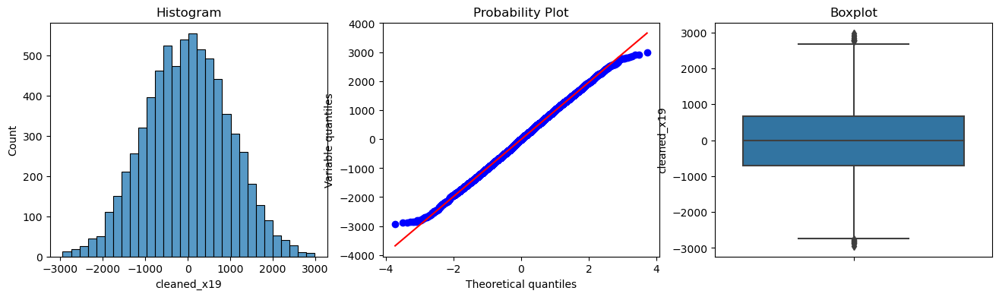

In [63]:
# Let's see the variables after outlier engineering

for i in data_trimmed[continuous]:
    diagnostic_plots(data_trimmed, i)

- We can see that the outliers are gone, but the variable distribution was distorted quite a bit. In order to fix this,
I am going to apply variable transformation

<br>Last operation before variable transformation is that I see there are a few variables left only one value on themselves after null value & outlier processes. Since, they will no provide any useful information to the model, I am removing those columns from the dataset.

In [64]:
# They hold only one value after outlier operation
data_trimmed_x = data_trimmed.drop(['x58','x67','x71','x84'], axis=1)

In [65]:
print('Number of observation after outlier trimming:',len(data_trimmed_x.index))

Number of observation after outlier trimming: 7052


### 3.4 Variable Transformation
Since I will use logistic regression, one of its assumption is that the variables are distributed normally. 
There are some variables they are skewed after outlier operation I just did. So, I will see how I could use mathematical transformation to make them look more normally in this section of the analysis.

There are some technics that I can apply:
- Logarithmic ---> where x>0.
- Exponential ---> where x!=0
- Reciprocal ---> sqr(X) or cube(X)
- Box-Cox ---> special cases, x>0
- Yeo-Johnson ---> special cases

In [67]:
continuous_vars = [var for var in data_trimmed_x.columns if data_trimmed_x[var].dtype!='O' and var not in discrete]

In [68]:
yjt = YeoJohnsonTransformer()
yjt.fit(data_trimmed[continuous_vars])

YeoJohnsonTransformer()

In [69]:
#transform variables: returns a new dataframe

X_tf = yjt.transform(data_trimmed_x[continuous_vars])

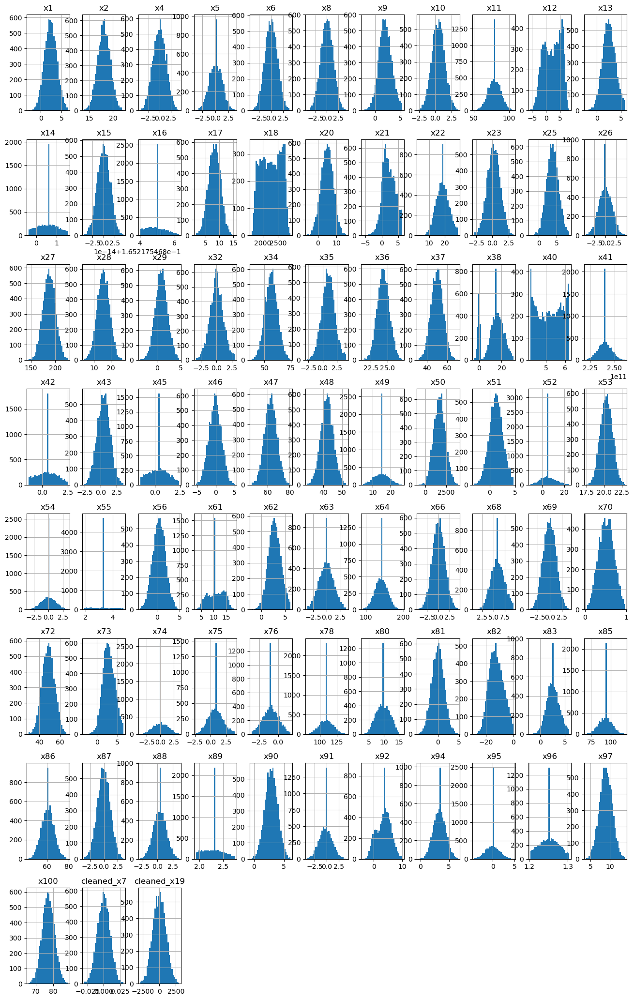

In [70]:
# Plot histograms to inspect variable distributions

X_tf.hist(bins=30, figsize=(16, 26), layout=(8, 11))
plt.show()

In [71]:
# Let's add these transformed columns into our current dataframe
for col in X_tf.columns:
    data_trimmed_x['transformed_'+col]=X_tf[col]

In [72]:
# Since we transformed the continous columns I will keep only transformed ones, will drop the original ones
continuous=data_trimmed_x.filter(like='transformed', axis=1)
discrete = [var for var in data_trimmed_x.columns if data_trimmed_x[var].dtype!='O' and data_trimmed_x[var].nunique()<4]
categorical=[var for var in data_trimmed_x.columns if data_trimmed_x[var].dtype=='O' ]

data_trimmed_x=data_trimmed_x[discrete+categorical+continuous.columns.to_list()]

In [73]:
data_trimmed_x.head()

,y,x59,x79,x98,x24,x31,x60,x65,x77,x93,...,transformed_x90,transformed_x91,transformed_x92,transformed_x94,transformed_x95,transformed_x96,transformed_x97,transformed_x100,transformed_cleaned_x7,transformed_cleaned_x19
7,0,0,1.0,0,male,yes,January,farmers,Missing,no,...,2.760741,-0.512431,1.846892,3.124327,-0.112767,1.288350,6.328536,78.671733,-0.010583,32.806694
10,1,0,1.0,0,male,no,Rare,progressive,Missing,no,...,1.916513,0.923933,1.019922,3.213619,-0.363654,1.230329,6.844704,80.518567,-0.005196,1396.706508
15,0,1,1.0,1,male,no,August,allstate,nissan,no,...,3.909933,-2.549789,4.190514,3.394245,-2.041487,1.252407,9.936736,70.378750,-0.001400,-900.175793
19,0,0,1.0,1,male,no,Rare,esurance,ford,no,...,3.663772,0.150573,-1.544330,3.184899,0.242155,1.218931,9.003309,72.656706,-0.008589,-423.215044
21,1,0,1.0,0,male,no,August,allstate,nissan,no,...,-0.241064,1.604100,1.323545,1.839678,0.619195,1.252318,6.167408,80.090052,0.002301,-26.625252


### 3.5 Logistic Regression Assumptions

Another assumption of logistic regression is the absence of multicolinearity. So, I am going to check correlation among independent variables.

- I am using Variance Inflation Factor (VIF) to measure the degree of multicollinearity in a set of independent variables. As a rule of thumb, a VIF value that exceeds 5 or 10 indicates a problematic amount of multicollinearity.

- Since there is no strict rule to choose threshold of the VIF value, I am going to rely on correlation matrix for those variables that their VIP values between 5 and 10.

In [74]:
# I am defining the VIF values first
from statsmodels.stats.outliers_influence import variance_inflation_factor

continuous_vars=[var for var in data_trimmed_x.columns if data_trimmed_x[var].dtype!='O' and var not in discrete]
# Use variance inflation factor to identify any significant multi-collinearity
def calc_vif(df):
    vif = pd.DataFrame()
    vif["variables"] = df.columns
    vif["VIF"] = [variance_inflation_factor(df.values, i) for i in range(df.shape[1])]
    return(vif)

df_VIF_results=calc_vif(data_trimmed_x[continuous_vars])  

<br>Rules:<br>
- I am definitely keeping in VIF values less than 5.
- I am definitely keeping out VIF values greater than 10.
- For those VIF values between 5-10, I will go through correlation matrix

In [75]:
# Deterine which variables will definitely be excluded !
df_VIF_results[df_VIF_results['VIF']>10]

,variables,VIF
1,transformed_x2,16.547352
23,transformed_x28,11.145001
26,transformed_x34,10.164353
28,transformed_x36,11.866925
29,transformed_x37,12.825481
38,transformed_x48,20.205526
43,transformed_x53,10.724815
70,transformed_x90,10.053794


In [76]:
# Select the variables that need to be gone through on correlation matrix
df_VIF_results[(df_VIF_results['VIF']>5) & (df_VIF_results['VIF']<10)]

,variables,VIF
5,transformed_x8,6.291024
9,transformed_x12,8.865320
15,transformed_x18,8.629556
16,transformed_x20,6.439400
22,transformed_x27,6.727603
31,transformed_x40,5.882382
37,transformed_x47,9.266570
40,transformed_x50,7.848694
46,transformed_x56,6.499927
48,transformed_x62,6.866395


<AxesSubplot:>

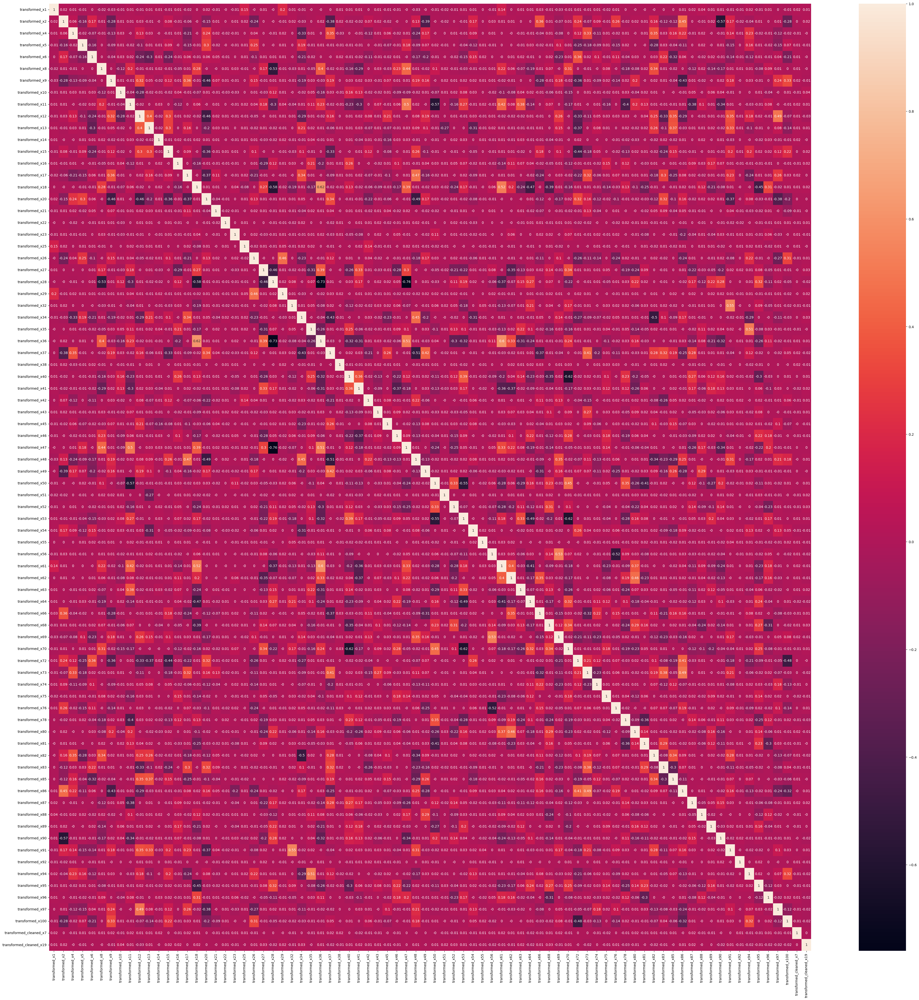

In [77]:
# Plot correlation matrix
correlation_matrix = data_trimmed_x[continuous_vars].corr().round(2)

figure = plt.figure(figsize=(50, 50))
sns.heatmap(data=correlation_matrix, annot=True)

<br>The variables in __5>VIP>10__ and __r >= 0.6 in correlation matrix__:<br>
- "transformed_x18", "transformed_x40", "transformed_x47", "transformed_x70"

In [78]:
# Now, I am exluding those multicollinear variables from my dataset.
round1=list(df_VIF_results[df_VIF_results['VIF']>10]['variables'].values)
round2=["transformed_x18", "transformed_x40", "transformed_x47", "transformed_x70"]
multicolinears=round1+round2

data_cleaned=data_trimmed_x.drop(multicolinears, axis=1)

In [79]:
print(f'Number of observations: {data_cleaned.shape[0]} ')
print(f'Number of features: {data_cleaned.shape[1]} \n')

Number of observations: 7052 
Number of features: 80 



<br>Important note that the reasons I did not use **correlation matrix** at the first place is because its challenge of interpretation (especially the the datasets have high number of features). Also, collinearity can exist between two or more variables even if no pair of variables is seen to have an exceptionally high correlation.
<br>
__Therefore, VIF is better way to assess multicollinearity__

### 3.6 Feature Scaling

Since the logistic regression is directly influenced by the scale of the variable (due to coefficients), magnitute matters. I will apply feature scaling as last step of the feature engineering to predict the best model.<br>

Feature scaling is generally the last step in the data preprocessing pipeline, performed just before training the machine learning algorithms.

- I am going to use Standardization because my data follows a Gaussian distribution especially after variable transformation.

- When standardising the data set,we need to standardizate and __learn the parameters from the train set first__, stored, and then used to scale test and future data. __This approach will help to not overfit the model.__ Thus, I will be applyin this step in Modelling notebook.

### 3.7 Save the final dataset

In [80]:
data_cleaned.to_csv('cleaned_train.csv')